## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, Getting points for calibrating the camera

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        cv2.imshow('img',img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

## Second, calculating camera calibration and distortion matrix

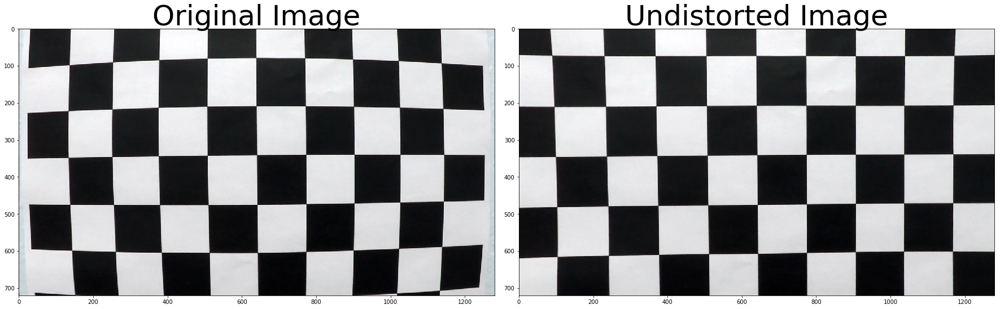

In [3]:
%matplotlib inline
img = cv2.imread('camera_cal/calibration1.jpg')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
dst = cv2.undistort(img, mtx, dist, None, mtx)
#cv2.imshow("distorted", img)
#cv2.waitKey(500)
#cv2.imshow("undistorted", dst)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Third, undistorting the example images

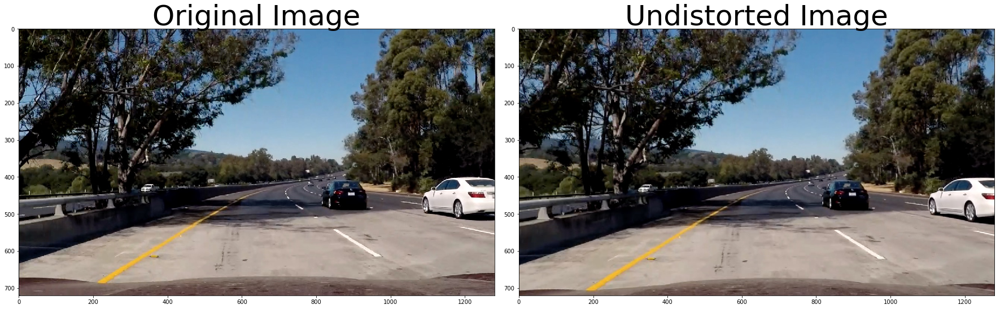

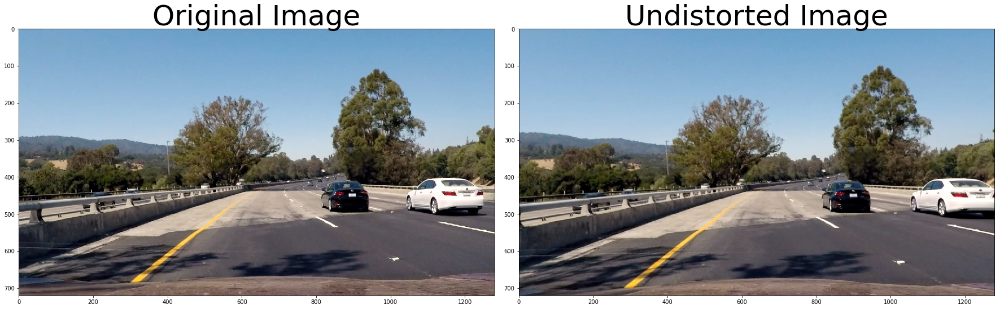

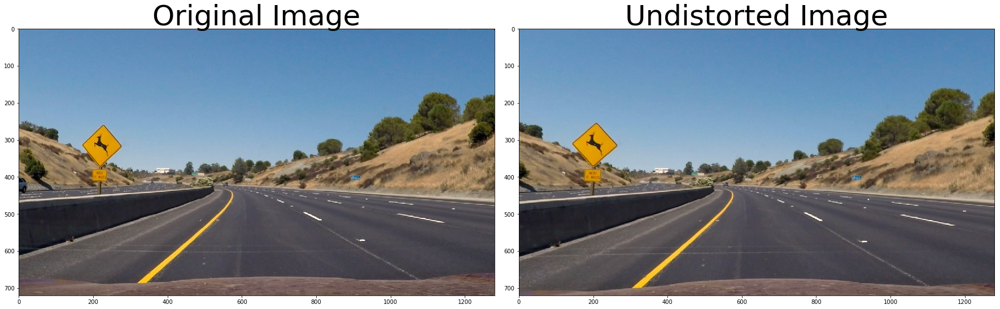

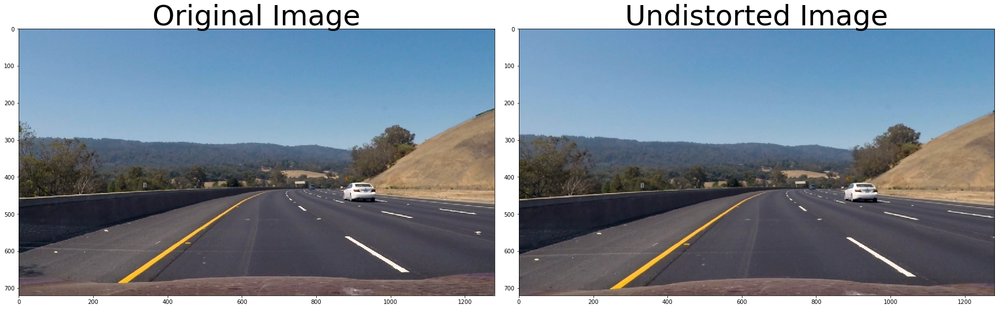

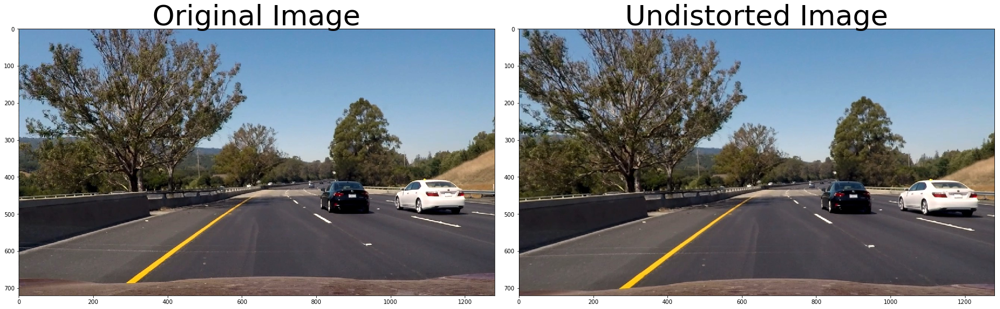

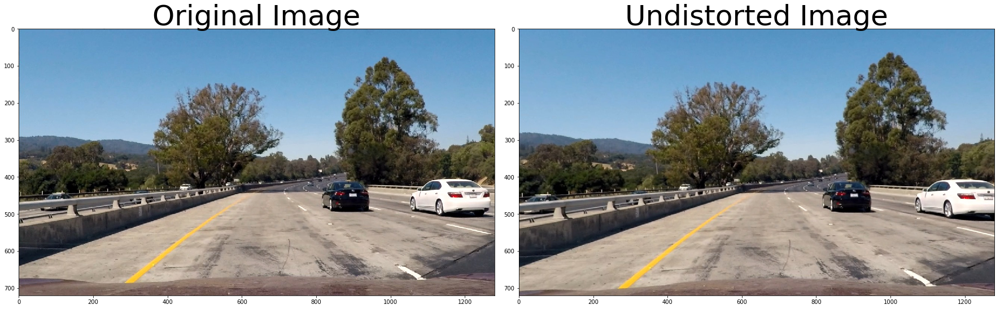

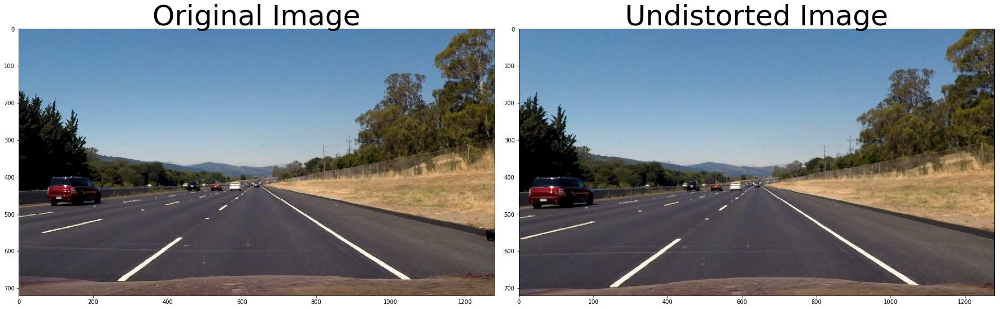

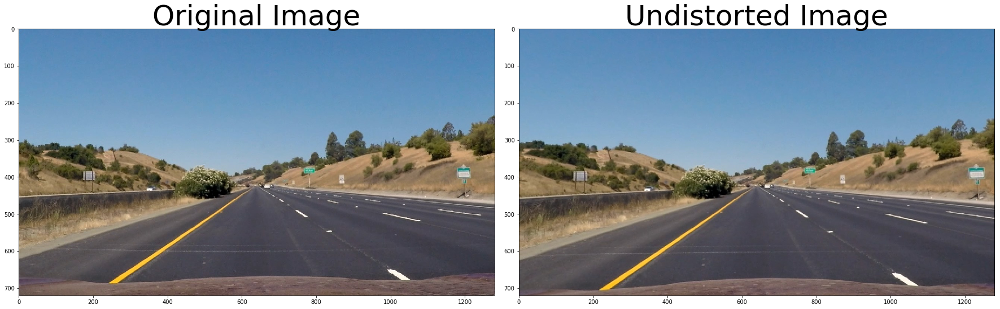

In [4]:
images = glob.glob('test_images/*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    newName = "output_images/undistorted_" + fname.split('/')[1]
    img = cv2.imread(fname)
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    cv2.imwrite(newName, undistorted)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(cv2.cvtColor(undistorted,cv2.COLOR_BGR2RGB))
    ax2.set_title('Undistorted Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Fourth, search for optimal parameters for finding lanes

<function __main__.update>

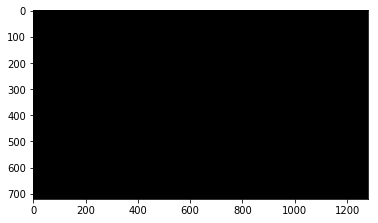

In [7]:
from ipywidgets import interact
import matplotlib.image as mpimg

def abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return binary_output

def mag_thresh(image, sobel_kernel=3, mag_thresh=(0, 255)):
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    return binary_output

def dir_threshold(image, sobel_kernel=3, dir_thresh=(0, np.pi/2)):
    binary_output = np.copy(img) # Remove this line
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= dir_thresh[0]) & (absgraddir <= dir_thresh[1])] = 1
    return binary_output

def HLS_threshold(HLS_image, channel='s', channel_thresh=(0,255)):
    if channel == 'h':
        channel_image = HLS_image[:,:,0]
    elif channel == 'l':
        channel_image = HLS_image[:,:,1]
    elif channel == 's':
        channel_image = HLS_image[:,:,2]
    binary_output =  np.zeros_like(channel_image)
    binary_output[(channel_image >= channel_thresh[0]) & (channel_image <= channel_thresh[1])] = 1
    return binary_output

#Taken from Ahmad Anwar who shared it in Facebook
rgb = mpimg.imread('output_images/undistorted_test2.jpg')

#image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
hls = cv2.cvtColor(rgb, cv2.COLOR_RGB2HLS)
image = hls[:,:,2]

def update(ksize, min_gradx, max_gradx, min_grady, max_grady, min_mag, max_mag, min_dir, max_dir, min_channel, max_channel):
    gradx = abs_sobel_thresh(image, orient="x", sobel_kernel=ksize, thresh=(min_gradx,max_gradx))
    grady = abs_sobel_thresh(image, orient="y", sobel_kernel=ksize, thresh=(min_grady,max_grady))
    mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(min_mag, max_mag))
    dir_binary = dir_threshold(image, sobel_kernel=ksize, dir_thresh=(min_dir, max_dir))
    color_binary = HLS_threshold(hls, channel='s', channel_thresh=(min_channel, max_channel))
    combined = np.zeros_like(dir_binary)
    combined[(((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))) & color_binary == 1] = 1
    plt.imshow(combined, cmap='gray')

interact(update, ksize=(1,31,2), min_gradx=(0,255), max_gradx=(0,255), min_grady=(0,255), max_grady=(0,255), min_mag=(0,255), max_mag=(0,255), min_dir=(0,np.pi/2), max_dir=(0,np.pi/2), min_channel=(0,255), max_channel=(0,255))

## Fifth, create thresholded binary image

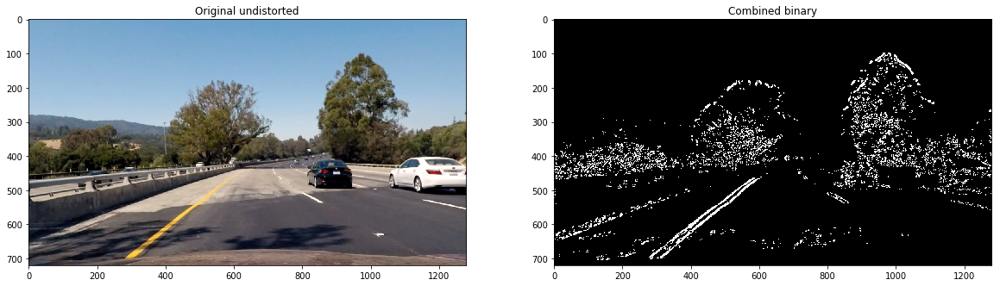

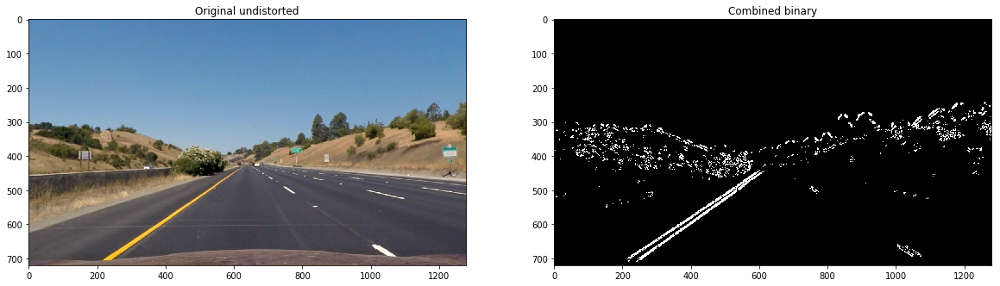

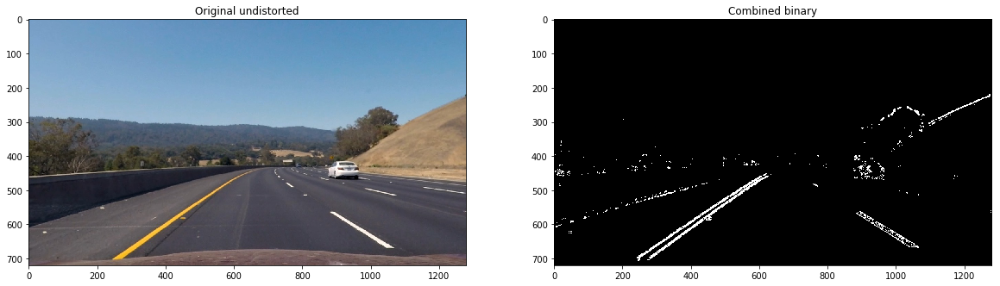

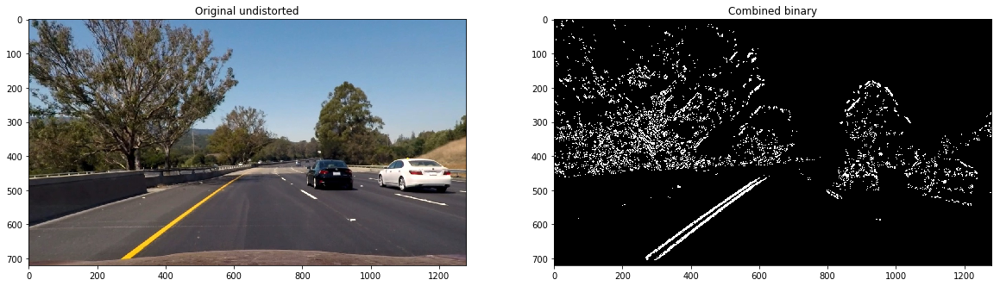

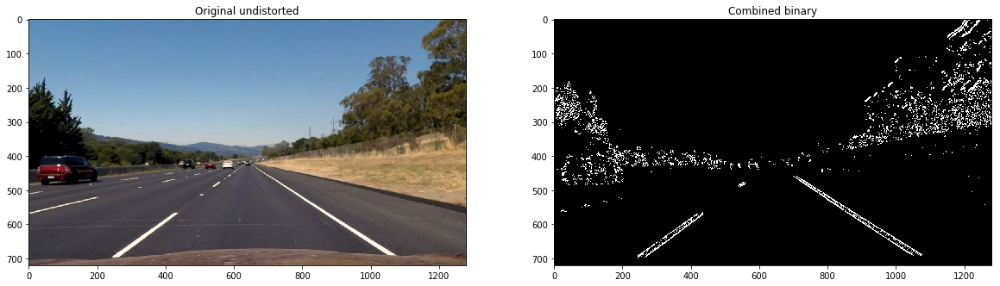

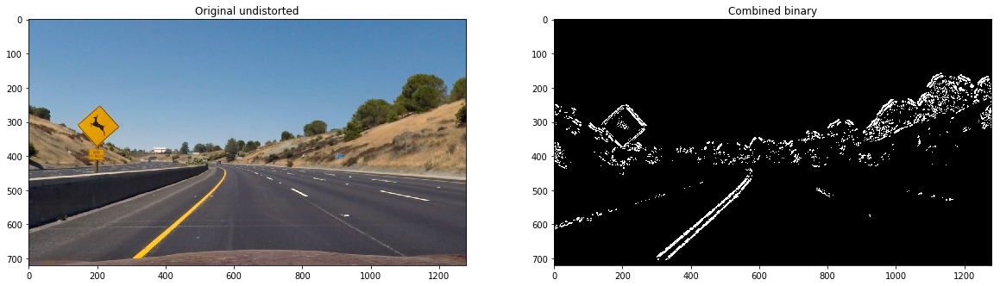

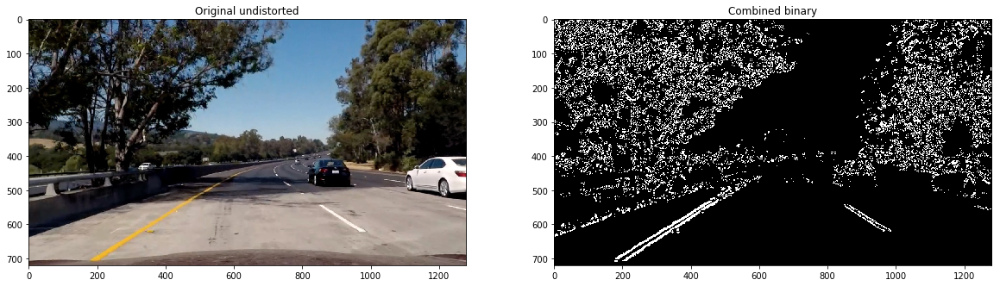

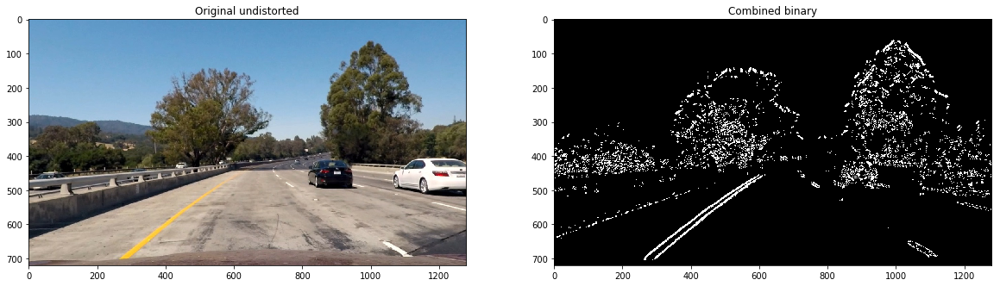

In [49]:
images = glob.glob('output_images/undistorted_*.jpg')

ksize = 15
min_gradx = 20
max_gradx = 120
min_grady = 20
max_grady = 120
min_mag = 60
max_mag = 200
min_dir = 0.485
max_dir = 1.085
min_channel = 10
max_channel = 200

def combined_binary(rgb):
    hls = cv2.cvtColor(rgb, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    
    gradx = abs_sobel_thresh(s_channel, orient="x", sobel_kernel=ksize, thresh=(min_gradx,max_gradx))
    grady = abs_sobel_thresh(s_channel, orient="y", sobel_kernel=ksize, thresh=(min_grady,max_grady))
    mag_binary = mag_thresh(s_channel, sobel_kernel=ksize, mag_thresh=(min_mag, max_mag))
    dir_binary = dir_threshold(s_channel, sobel_kernel=ksize, dir_thresh=(min_dir, max_dir))
    color_binary = HLS_threshold(hls, channel='s', channel_thresh=(min_channel, max_channel))
    combined = np.zeros_like(dir_binary)
    combined[(((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))) & color_binary == 1] = 1
    return combined

for fname in images:
    newName = "output_images/binary_" + fname.split('/')[1]
    
    rgb = mpimg.imread(fname)
    
    combined = combined_binary(rgb)

    # Plotting thresholded images
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.set_title('Original undistorted')
    ax1.imshow(rgb)

    ax2.set_title('Combined binary')
    ax2.imshow(combined, cmap='gray')
    

## Sixth, get perspective transform parameters

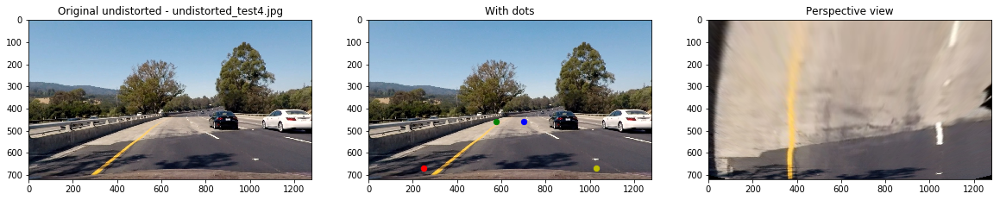

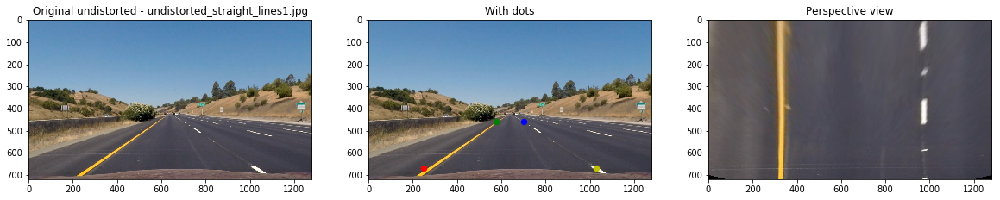

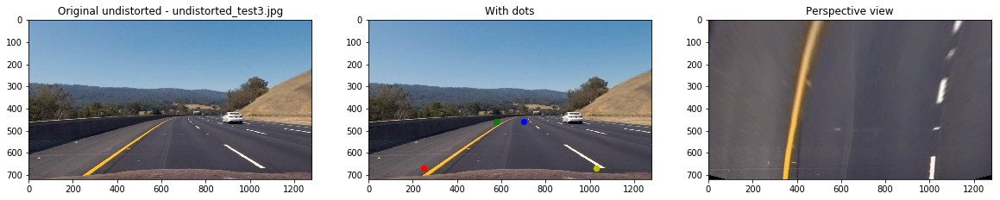

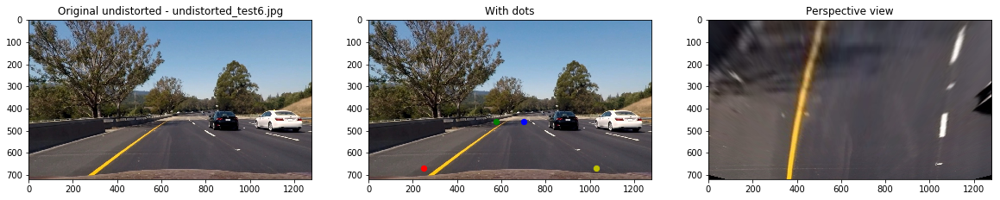

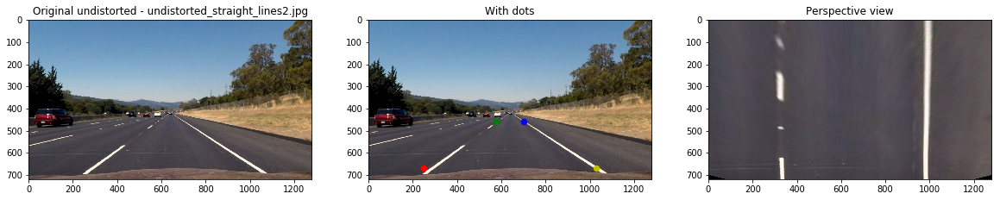

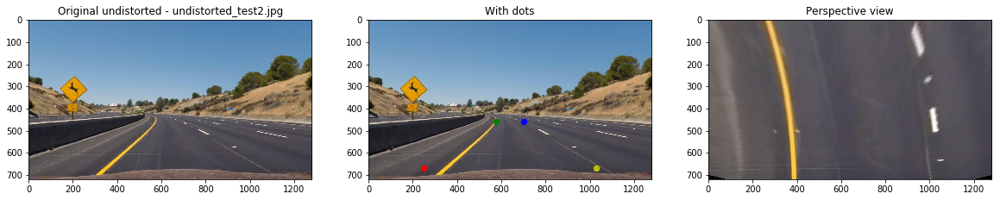

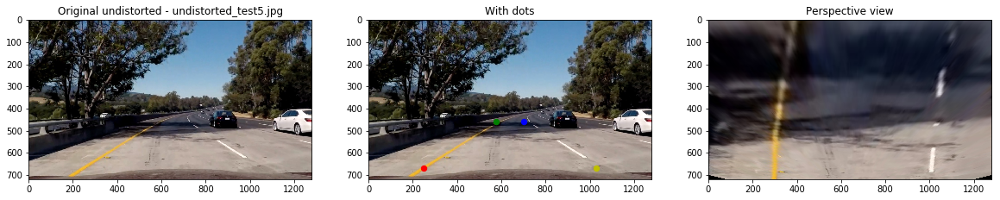

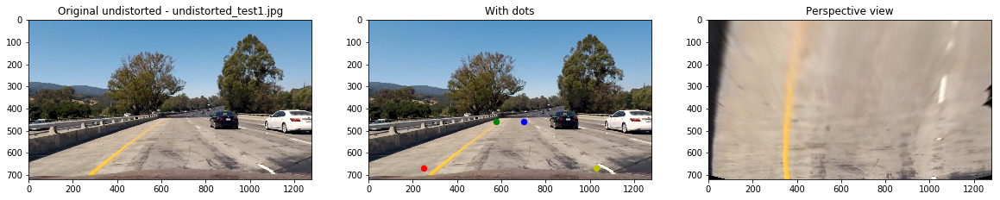

In [54]:
images = glob.glob('output_images/undistorted_*.jpg')

def warp_image(img, src, dst):
    img_size = (img.shape[1], img.shape[0])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size)
    return warped

for fname in images:
    rgb = mpimg.imread(fname)
    hor_max = rgb.shape[1]
    ver_max = rgb.shape[0]
    
    img_size = (rgb.shape[1], rgb.shape[0])
    
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
    ax1.set_title('Original undistorted - ' + str(fname.split('/')[1]))
    ax1.imshow(rgb)
    ax2.set_title('With dots')
    
    down_horizontal = 390
    down_vertical = 50
    up_horizontal = 63
    up_vertical = 100
    down_left_hor = int(hor_max/2 - down_horizontal)
    down_left_ver = int(ver_max - down_vertical)
    up_left_hor = int(hor_max/2 - up_horizontal)
    up_left_ver = int(ver_max/2 + up_vertical)
    up_right_hor = int(hor_max/2 + up_horizontal)
    up_right_ver = int(ver_max/2 + up_vertical)
    down_right_hor = int(hor_max/2 + down_horizontal)
    down_right_ver = int(ver_max - down_vertical)
    
    ax2.scatter(x=[down_left_hor], y=[down_left_ver], c='r', s=40) #Down left
    ax2.scatter(x=[up_left_hor], y=[up_left_ver], c='g', s=40) #Up left
    ax2.scatter(x=[up_right_hor], y=[up_right_ver], c='b', s=40) #Up right
    ax2.scatter(x=[down_right_hor], y=[down_right_ver], c='y', s=40) #Down right
    ax2.imshow(rgb)
    
    src = np.float32([[down_left_hor, down_left_ver],
                      [up_left_hor, up_left_ver],
                      [up_right_hor, up_right_ver],
                      [down_right_hor, down_right_ver]])
    dst = np.float32([[300, ver_max],
                      [300, 0],
                      [hor_max - 300, 0],
                      [hor_max - 300, ver_max]])
    warped = warp_image(rgb, src, dst)
    ax3.set_title('Perspective view')
    ax3.imshow(warped)

## Seventh, perspective transform the binary images

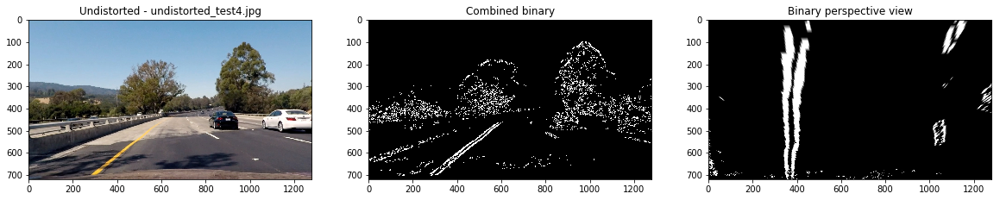

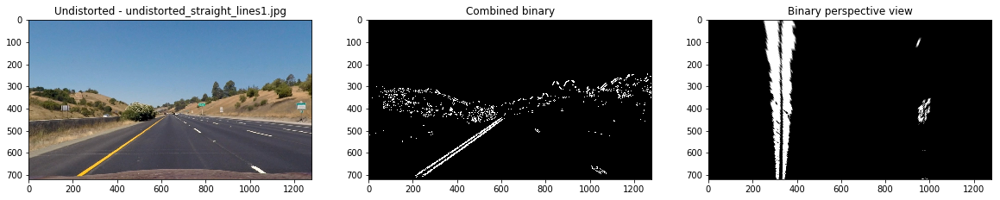

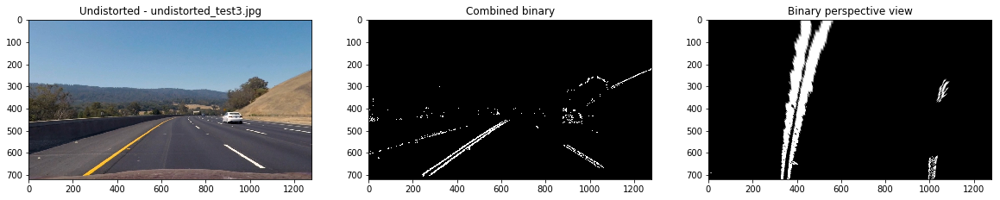

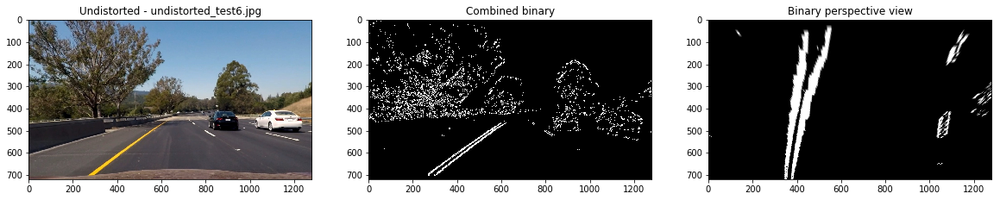

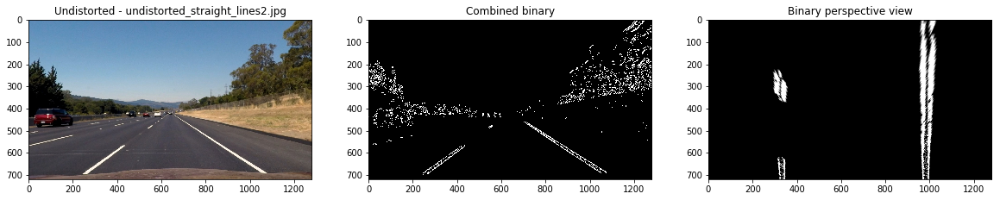

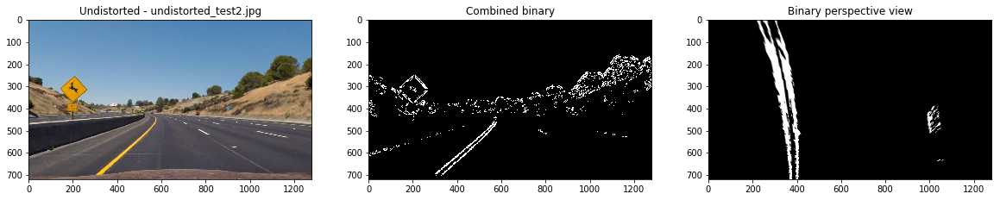

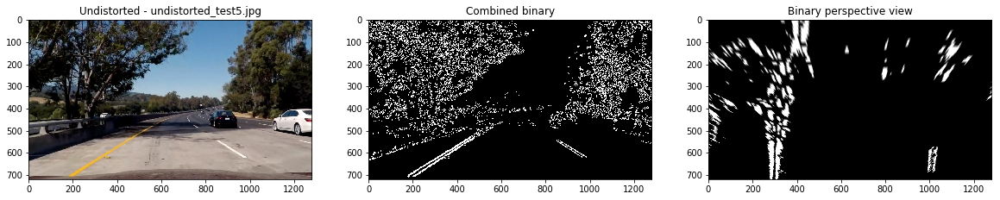

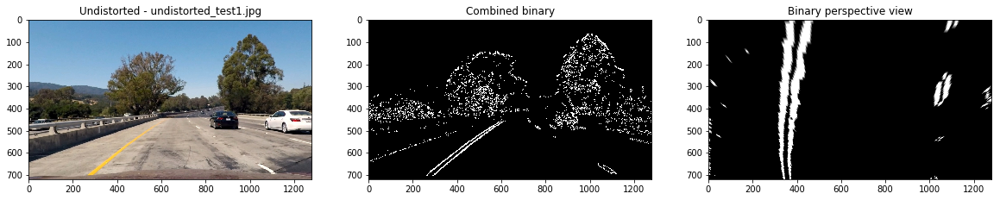

In [58]:
images = glob.glob('output_images/undistorted_*.jpg')

src = np.float32([[250, 670],
                  [577, 460],
                  [703, 460],
                  [1030, 670]])
dst = np.float32([[300, 720],
                  [300, 0],
                  [980, 0],
                  [980, 720]])

binary_perspective = []

for fname in images:
    rgb = mpimg.imread(fname)
    
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
    ax1.set_title('Undistorted - ' + str(fname.split('/')[1]))
    ax1.imshow(rgb)
    
    binary_img = combined_binary(rgb)
    ax2.set_title('Combined binary')
    ax2.imshow(binary_img, cmap='gray')
    
    warped = warp_image(binary_img, src, dst)
    ax3.set_title('Binary perspective view')
    ax3.imshow(warped, cmap='gray')
    
    